In [9]:
from ecallisto_ng.data_fetching.get_information import get_tables, get_table_names_with_data_between_dates
from datetime import datetime
from ecallisto_ng.data_fetching.get_data import get_data
from ecallisto_ng.plotting.plotting import plot_spectogram_mpl, fill_missing_timesteps_with_nan
from ecallisto_ng.data_processing.utils import elimwrongchannels, subtract_rolling_background, subtract_constant_background
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from torch.nn import SmoothL1Loss
from ecallisto_ng.plotting.plotting import plot_spectogram
from ecallisto_ng.data_fetching.get_data import NoDataAvailable, get_data
from ecallisto_ng.plotting.utils import (
    fill_missing_timesteps_with_nan,
)
from glob import glob
import torch
import torch.optim as optim

In [10]:
import scipy.signal
from scipy.ndimage import median_filter

def mean_filter(df, kernel_size=(5, 5)):
    kernel = np.ones(kernel_size) / (kernel_size[0] * kernel_size[1])
    data = scipy.signal.convolve2d(df.to_numpy(), kernel, 'same')
    df.values[:] = data
    return df


def apply_median_filter(df, size=(3, 3)):
    data = median_filter(df.values, size)
    df.values[:] = data
    return df


In [11]:
start_datetime = datetime(2023, 9, 8, 0, 0, 0).strftime("%Y-%m-%d %H:%M:%S")
end_datetime = datetime(2023, 9, 8, 23, 59, 59).strftime("%Y-%m-%d %H:%M:%S")
data_folder = 'data_3'
filter = None
location = ['swiss', 'germany', 'austria', 'glasgow', 'egypt', 'ethiopia', 'denmark', 'spain', 'triest', 'krim']

In [12]:
files = glob(f"{data_folder}/*.parquet")

In [13]:
datas = [pd.read_parquet(file) for file in files] #if any(loc in file for loc in location)]

In [14]:
# Process data
data_processed = []
for data in datas:
    # Check that it has at least 100 columns
    if len(data.columns) < 100:
        continue
    if max([float(col) for col in data.columns]) > 150:
        continue
    try:
        # Cut away columns with value above x and below y
        columns = np.array([float(col) for col in data.columns])
        data = data.loc[:, (columns > 15) & (columns < 85)]
        data = fill_missing_timesteps_with_nan(data)
        data = elimwrongchannels(data)
        data = subtract_constant_background(data, 10)
        if filter == 'median':
            data = apply_median_filter(data)
        elif filter == 'mean':
            data = mean_filter(data)
        else:
            pass
        # Cap min value to 0
        data[data < 0] = 0
        # Min max scaling to 0 and 1
        data = ((data - data.min()) / (data.max() - data.min()))
        data.fillna(0, inplace=True) 
        data_processed.append(data)
    except Exception as e:
        print(e)
        print(data.columns)

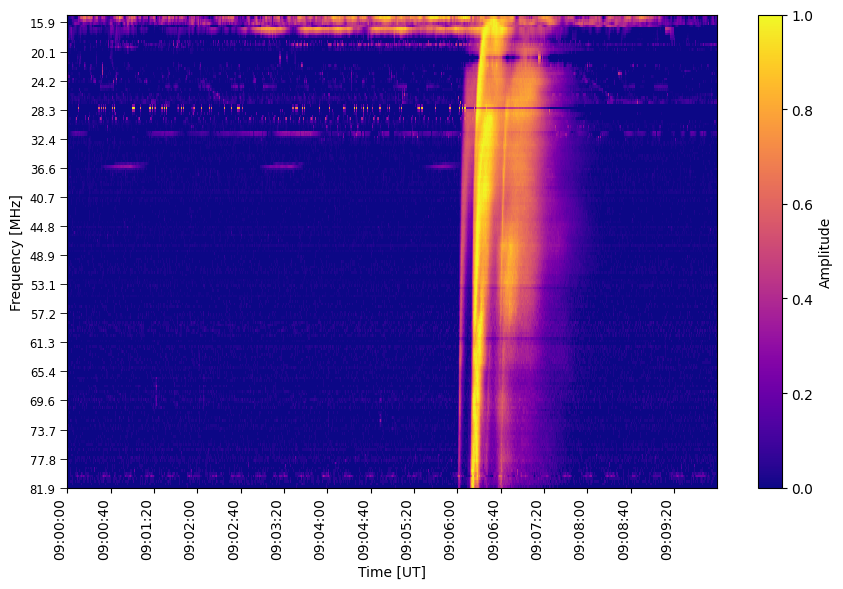

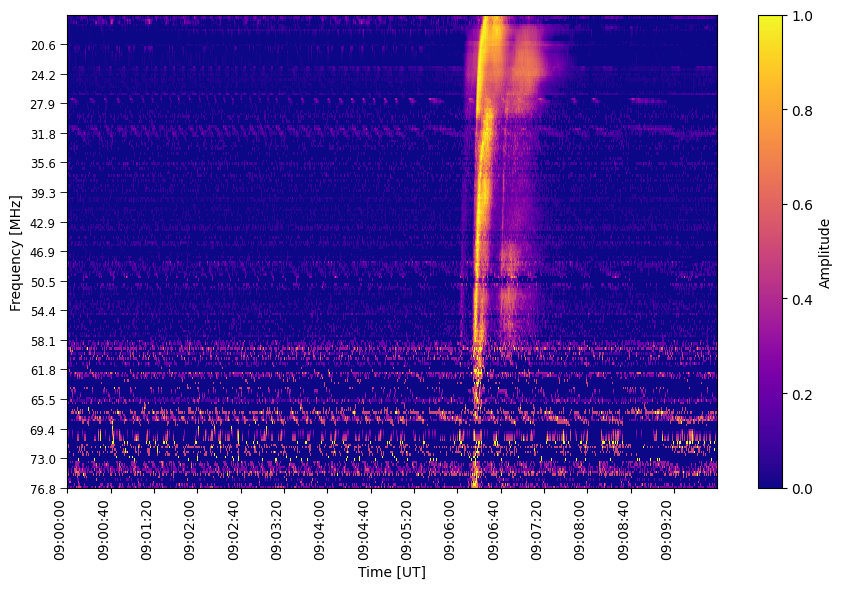

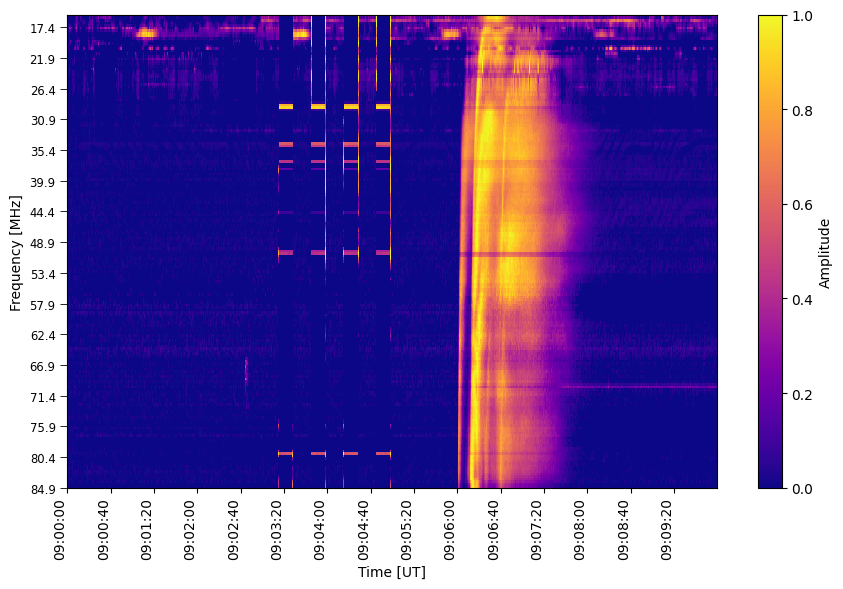

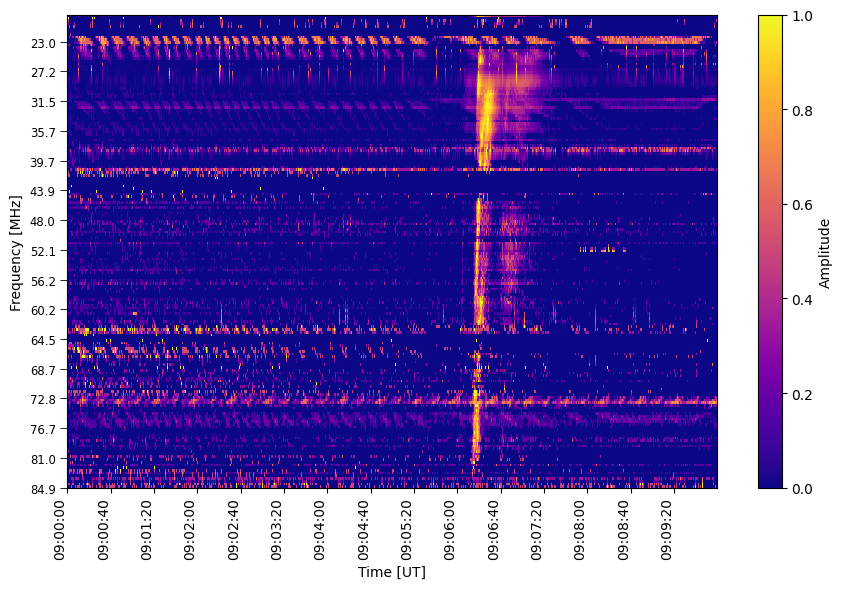

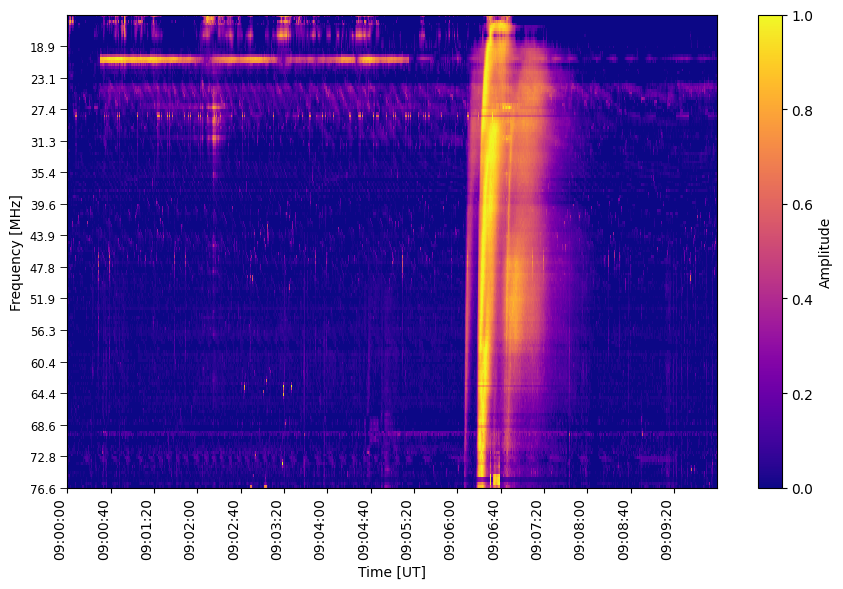

...

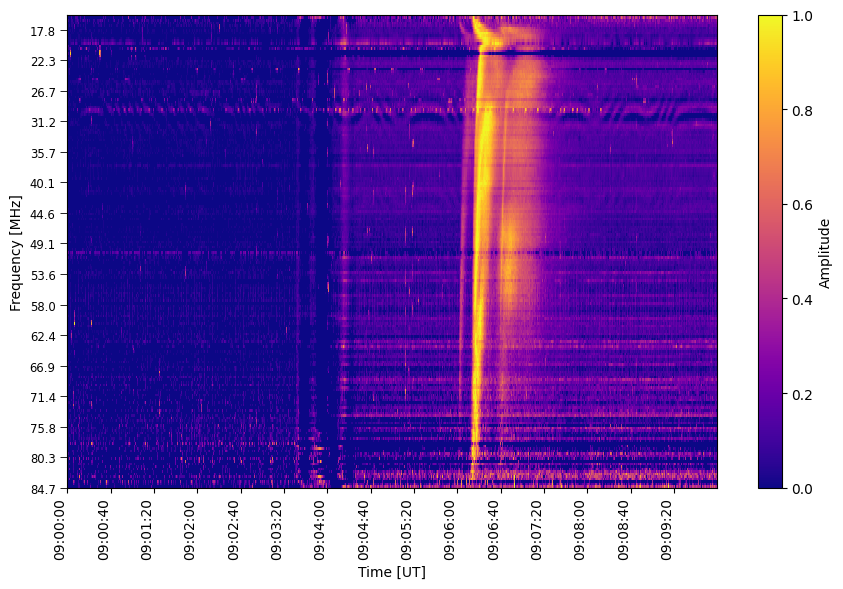

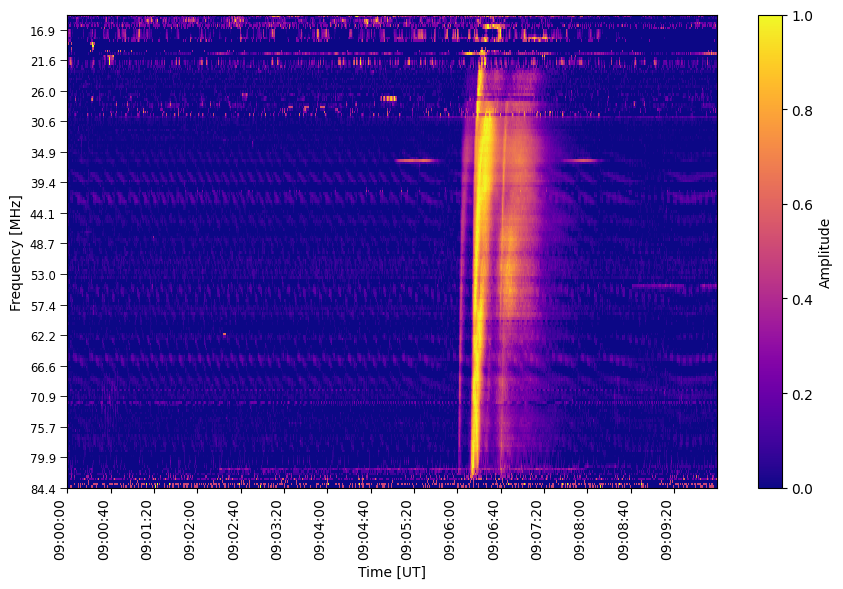

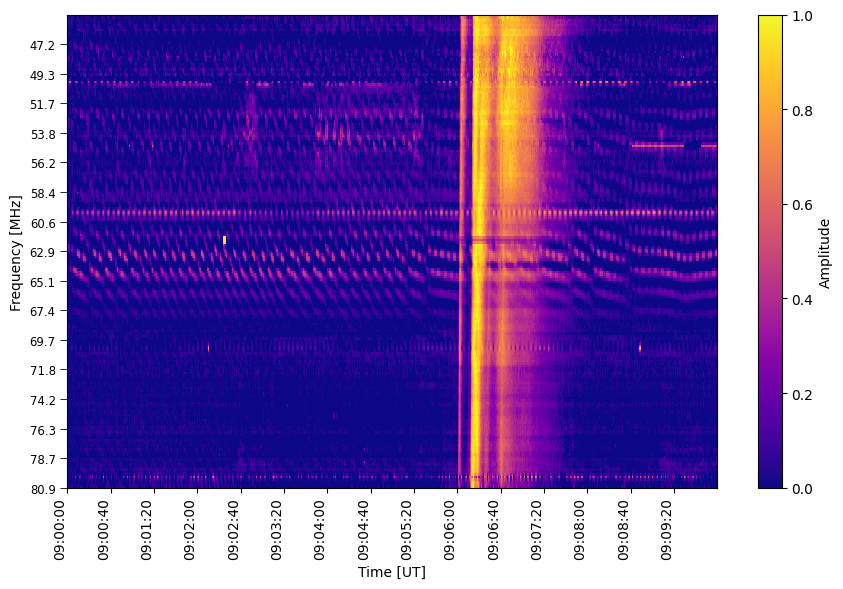

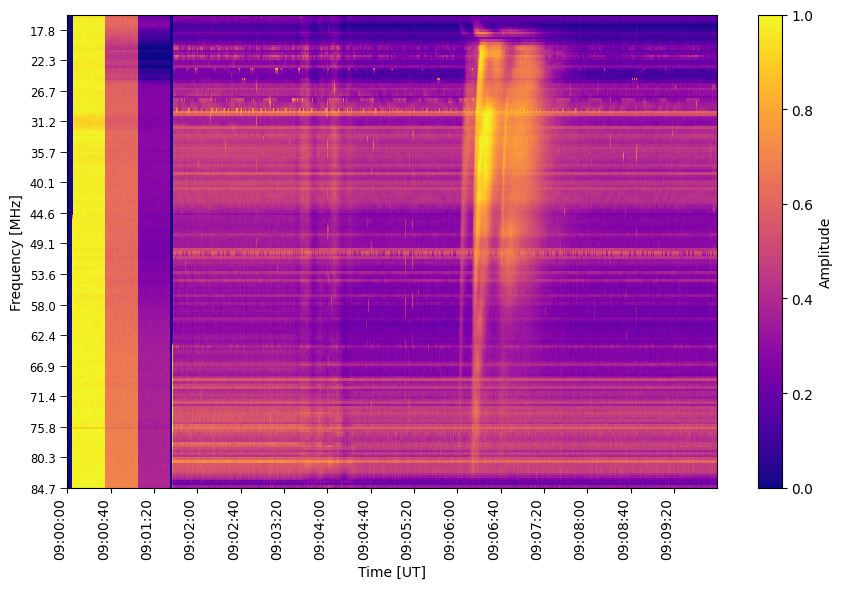

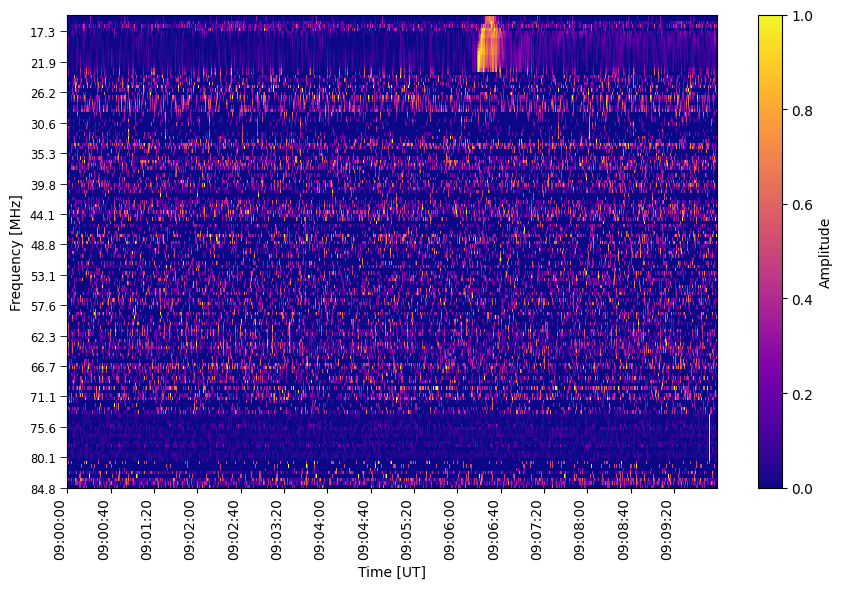

In [15]:
for data in data_processed:
    try:
        instr_name = data.attrs['INSTRUME']
    except:
        instr_name = 'unknown'
    fig = plot_spectogram_mpl(fill_missing_timesteps_with_nan(data), start_datetime=start_datetime, end_datetime=end_datetime, instrument_name=instr_name)

In [16]:
from typing import List
def make_times_match_spectograms(dfs: List[pd.DataFrame]):
    min_datetime = min([df.index.min() for df in dfs])
    print(min_datetime)
    max_datetime = max([df.index.max() for df in dfs])
    print(max_datetime)
    new_dfs = []
    for df in dfs:
        df = fill_missing_timesteps_with_nan(df, start_datetime=min_datetime, end_datetime=max_datetime)
        new_dfs.append(df)


    return new_dfs

In [37]:
import pandas as pd
from typing import List

def interpolate_columns(df: pd.DataFrame, all_columns: List[float]) -> pd.DataFrame:
    """Interpolate missing columns in a dataframe."""
    df = df.reindex(columns=all_columns)
    df.interpolate(method='linear', axis=1, inplace=True, limit_area='inside')
    return df

def make_frequencies_match_spectograms(dfs: List[pd.DataFrame]) -> List[pd.DataFrame]:
    # Gather all unique frequencies across all dataframes
    all_columns = sorted(list(set(float(col) for df in dfs for col in df.columns)))

    # To str agian
    all_columns = [str(col) for col in all_columns]

    # Interpolate missing columns for each dataframe
    new_dfs = [interpolate_columns(df, all_columns) for df in dfs]

    return new_dfs


In [38]:
datas_sample = make_times_match_spectograms(data_processed)
datas_sample = make_frequencies_match_spectograms(datas_sample)

2023-09-28 09:00:00
2023-09-28 09:09:59.750000


In [158]:
### PARAMTERS and helper functions.
grad_x_lambda = 1 # Adjust based on your needs
grad_y_lambda = 1
huber_delta = 50 # Adjust based on your needs
filtered_loss_threshold = 0.5
min_frac_instruments_to_keep = 0.7

## Some setup

# Init device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Convert observed spectrograms to PyTorch tensors
tensors = [torch.tensor(data.values, dtype=torch.float32, requires_grad=False, device=device) for data in datas_sample]

# Initialize weights for each instrument
num_instruments = len(tensors)
weights = torch.ones(num_instruments, requires_grad=True, device=device)
##

from torch.nn import HuberLoss
# Compute loss
def compute_loss(tensor, S_hat, which='filtered_loss'):
    mask = ~torch.isnan(tensor)  # Create a mask where tensor is not NaN
    diff = tensor[mask] - S_hat[mask]
    if which == 'L2':
        loss = torch.square(diff)
    elif which == 'L1':
        loss = torch.abs(diff)
    elif which == 'filtered_loss':
        loss = compute_filtered_loss(diff, filtered_loss_threshold)
    elif which == 'Huber':
        smooth_l1_loss = HuberLoss(reduction='none', delta=huber_delta)
        loss = smooth_l1_loss(tensor[mask], S_hat[mask])
    else:
        print("Wrong which")
    return torch.sum(loss) / mask.sum()


def compute_reg_loss(S_hat, grad_x_lambda, grad_y_lambda, which='L2'):
    grad_y, grad_x = torch.gradient(S_hat)

    if which == 'L2':
        grad_x_term = torch.square(grad_x)
        grad_y_term = torch.square(grad_y)
    elif which == 'L1':
        grad_x_term = torch.abs(grad_x)
        grad_y_term = torch.abs(grad_y)
    else:
        print("Wrong which")

    reg_grad_x = grad_x_lambda * torch.sum(grad_x_term) / grad_x.nelement()
    reg_grad_y = grad_y_lambda * torch.sum(grad_y_term) / grad_y.nelement()

    return reg_grad_x + reg_grad_y

def compute_filtered_loss(diff, threshold):
    abs_error = torch.abs(diff)
    mask = abs_error < threshold
    filtered_diff = diff[mask]
    loss = torch.square(filtered_diff)  # or other loss of your choice
    return loss

# Constraint function
def apply_instrument_constraint(weights, min_ones_ratio=min_frac_instruments_to_keep):
    num_ones = int(min_ones_ratio * len(weights))
    sorted_weights, _ = torch.sort(weights)
    threshold = sorted_weights[-num_ones]
    constrained_weights = (weights >= threshold).float()
    return constrained_weights

Using device: cuda:0


In [159]:
# Init S_hat
S_hat = torch.nanmedian(torch.stack(tensors), dim=0)[0]

S_hat = torch.nanquantile(torch.stack(tensors), 0.3, dim=0)

# Send to device
S_hat = torch.tensor(S_hat, requires_grad=True, device=device)
# Initialize S_hat randomly with the shape of a DF
#S_hat = torch.randint(0, 255, tensors[0].shape, dtype=torch.float32, requires_grad=True, device=device)

/tmp/ipykernel_105254/1110151131.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  S_hat = torch.tensor(S_hat, requires_grad=True, device=device)


/tmp/ipykernel_105254/3290455.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(s_hat_df, 's_hat_init', start_datetime, end_datetime).show()


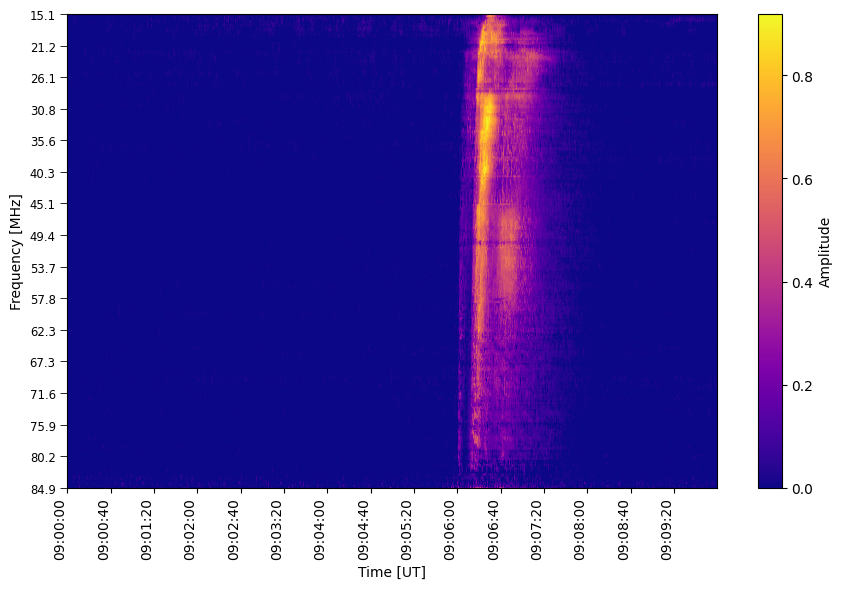

In [160]:
# plot
S_hat_cpu = S_hat.detach().cpu()
s_hat_df = pd.DataFrame(S_hat_cpu, columns=datas_sample[1].columns, index=datas_sample[1].index)
plot_spectogram_mpl(s_hat_df, 's_hat_init', start_datetime, end_datetime).show()

In [162]:
# Init device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Convert observed spectrograms to PyTorch tensors
tensors = [torch.tensor(data.values, dtype=torch.float32, requires_grad=False, device=device) for data in datas_sample]

# Initialize weights for each instrument
num_instruments = len(tensors)
weights = torch.ones(num_instruments, requires_grad=True, device=device)


# Define the optimizer
optimizer = optim.Adam([S_hat, weights], lr=0.1) # Multiplier per instrument, good station get a fixed value of 1. Or maybe that of x stations, at least 6 have to be used (sum of weights have to be at least 6)
# Add shift to images, also to optimize. Fix also by half a pixel? Maybe Multipler per time to optimize? 
# Contrainst that 

# Create list of intermediate results
S_hats = []

# Training loop
for epoch in range(0, 301):
    ## Loss calculation 
    # Initialize a list to store individual losses
    individual_losses = []
    
    # Loop through each tensor and its corresponding weight
    for tensor, weight in zip(tensors, weights):
        # Compute the loss for the current tensor
        individual_loss = compute_loss(tensor, S_hat)
        
        # Weight the loss
        weighted_loss = individual_loss * weight
        
        # Store the weighted loss
        individual_losses.append(weighted_loss)

    # Stack individual losses into a single tensor and sum them
    stacked_losses = torch.stack(individual_losses)
    total_loss = torch.sum(stacked_losses)
    
    # Regularized loss
    loss_reg = total_loss + compute_reg_loss(S_hat, grad_x_lambda, grad_y_lambda)
    
    # Backpropagation
    optimizer.zero_grad()
    loss_reg.backward()
    optimizer.step()

    # Ensure weights are non-negative
    with torch.no_grad():
        weights.data = torch.relu(weights.data)

    # Apply constraint to weights
    with torch.no_grad():
        weights.data = apply_instrument_constraint(weights.data)
    
    if epoch % 20 == 0:
        print(f'Epoch {epoch}, Loss: {loss_reg.item()}')
        S_hats.append(S_hat.detach().cpu().numpy())

# Once optimization is done, S_hat is your denoised spectrogram
final_S_hat = S_hat.detach().cpu().numpy()
S_hats.append(final_S_hat)

Using device: cuda:0
Epoch 0, Loss: 0.3280467987060547
Epoch 20, Loss: 0.12829181551933289
Epoch 40, Loss: 0.12480386346578598
Epoch 60, Loss: 0.12405333667993546
Epoch 80, Loss: 0.12395966053009033
Epoch 100, Loss: 0.12394694238901138
Epoch 120, Loss: 0.12394547462463379
Epoch 140, Loss: 0.12394518405199051
Epoch 160, Loss: 0.12394507229328156
Epoch 180, Loss: 0.12394514679908752
Epoch 200, Loss: 0.12394514679908752
Epoch 220, Loss: 0.12394507974386215
Epoch 240, Loss: 0.12394507229328156
Epoch 260, Loss: 0.12394506484270096
Epoch 280, Loss: 0.12394507229328156
Epoch 300, Loss: 0.12394507229328156


In [163]:
weights

tensor([1., 1., 1., 1., 0., 0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
        0., 0.], device='cuda:0', requires_grad=True)

In [165]:
from ipywidgets import interact
import numpy as np
import pandas as pd

@interact(index=(0, len(S_hats) - 1))
def plot_spectrogram(index=0):
    s_hat_df = pd.DataFrame(S_hats[index], columns=datas_sample[1].columns, index=datas_sample[1].index)
    plot_spectogram_mpl(s_hat_df, 's_hat', start_datetime, end_datetime).show()


interactive(children=(IntSlider(value=0, description='index', max=16), Output()), _dom_classes=('widget-intera…

/tmp/ipykernel_105254/2515428371.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(s_hat_df, 's_hat_init', start_datetime, end_datetime).show()


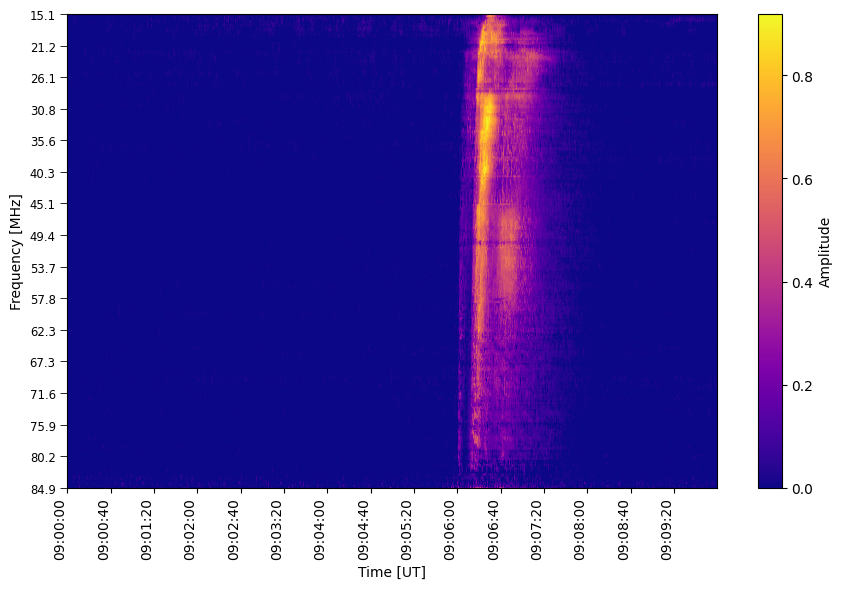

In [167]:
s_hat_df = pd.DataFrame(S_hat_cpu, columns=datas_sample[1].columns, index=datas_sample[1].index)
plot_spectogram_mpl(s_hat_df, 's_hat_init', start_datetime, end_datetime).show()

GERMANY-DLR
SPAIN-PERALEJOS
NORWAY-EGERSUND
AUSTRIA-OE3FLB
SWISS-Landschlacht
SPAIN-PERALEJOS
SWISS-MUHEN
BIR
GREENLAND


KeyError: 'INSTRUME'

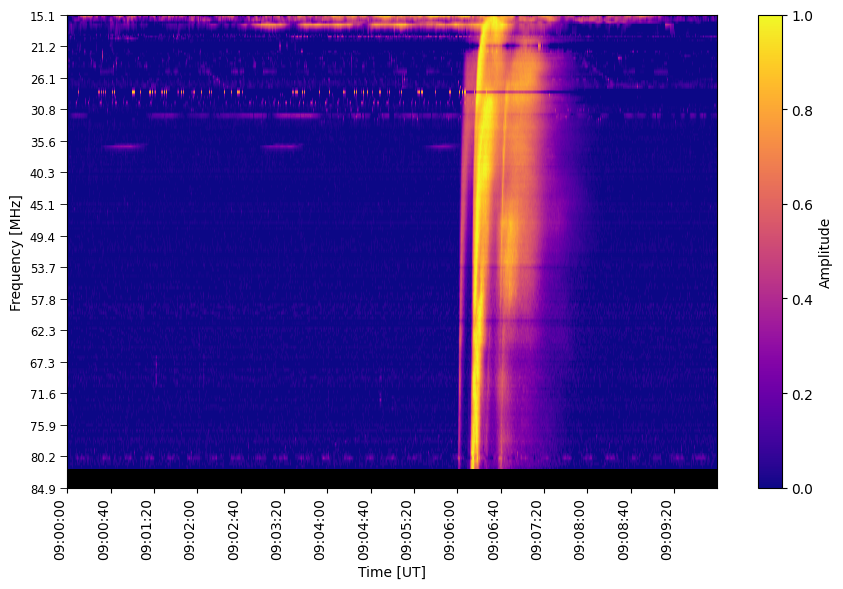

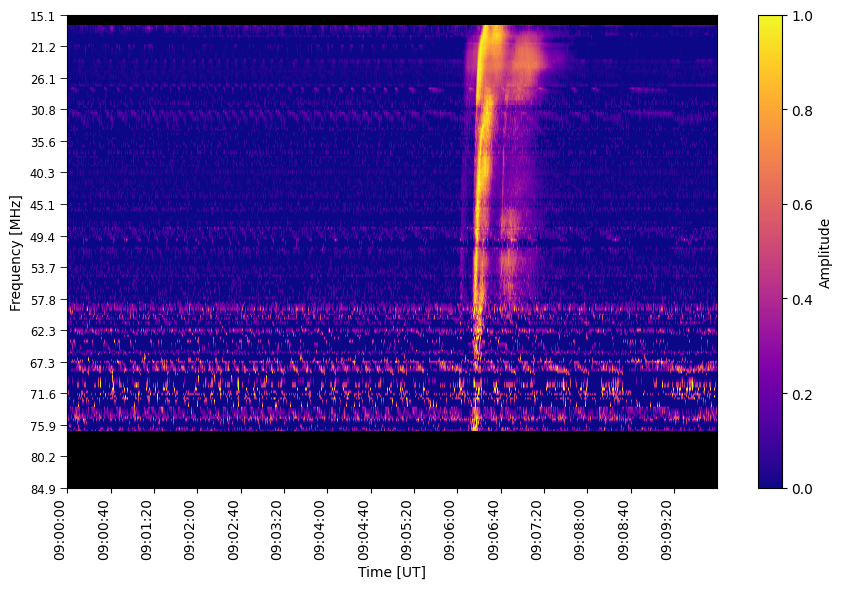

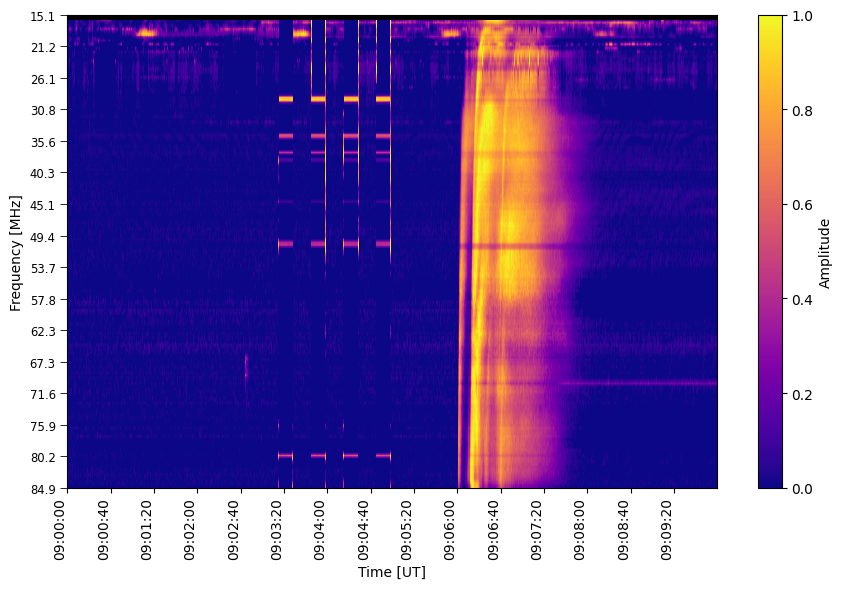

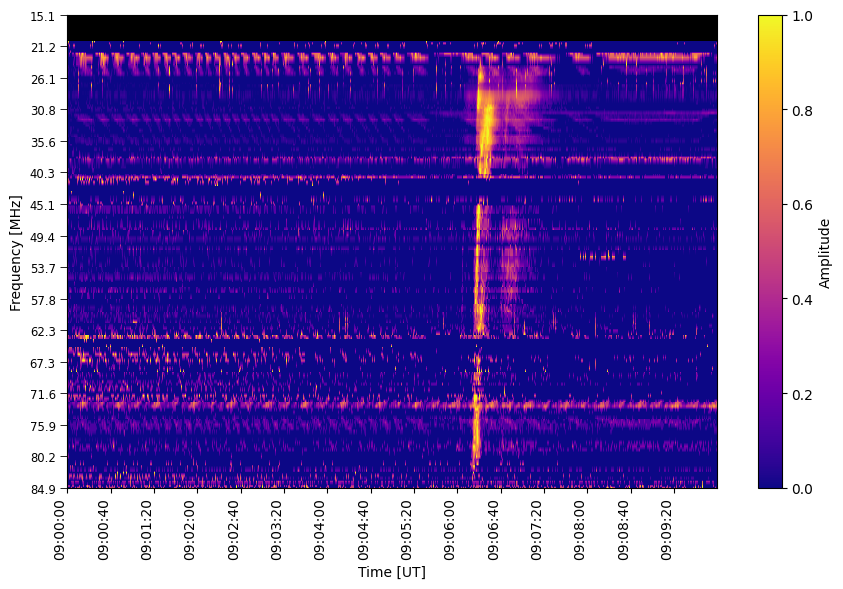

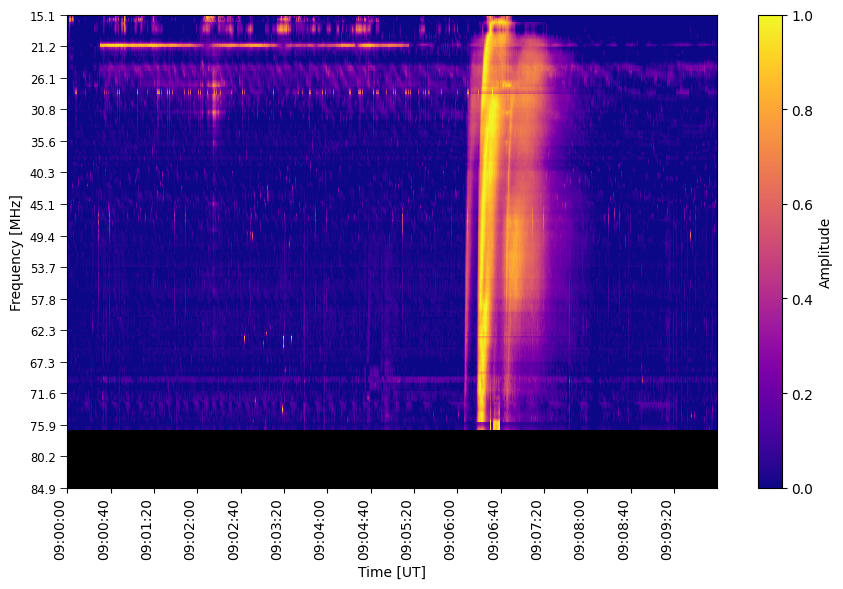

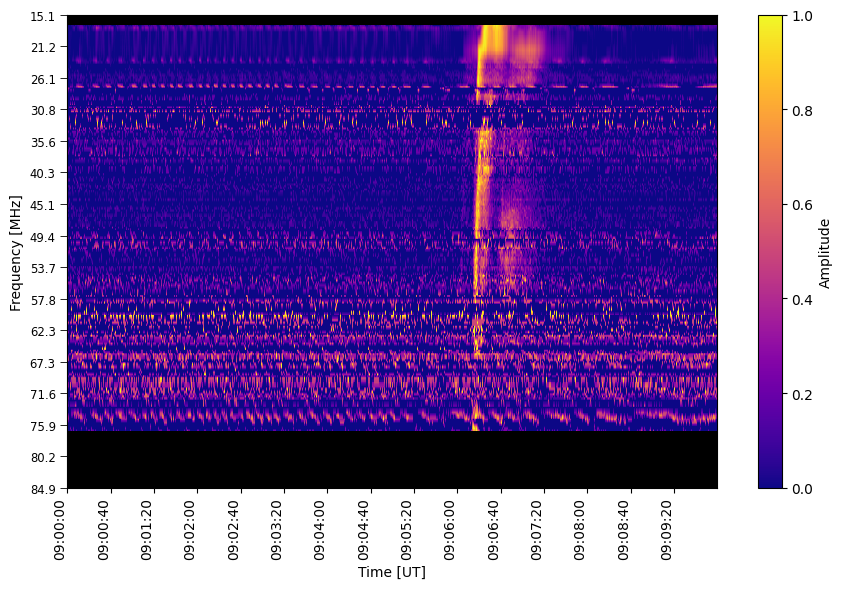

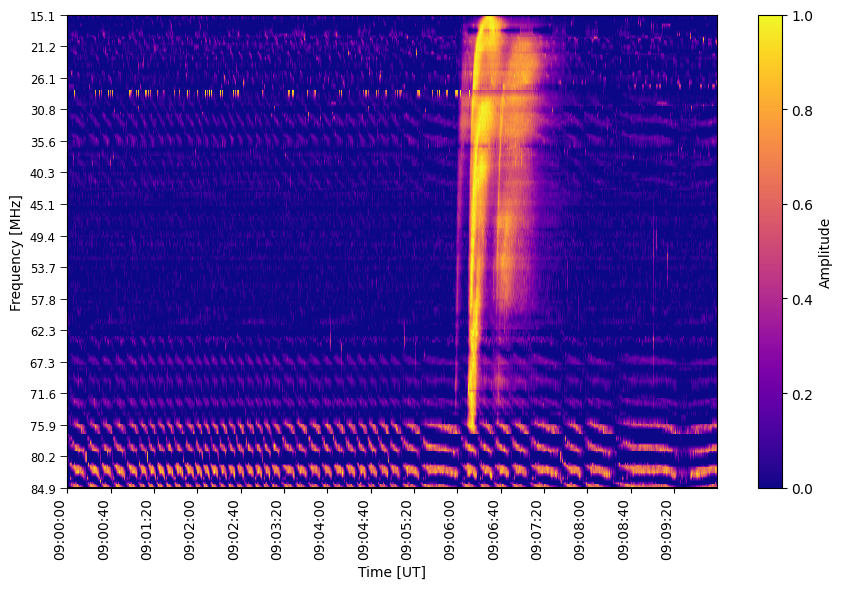

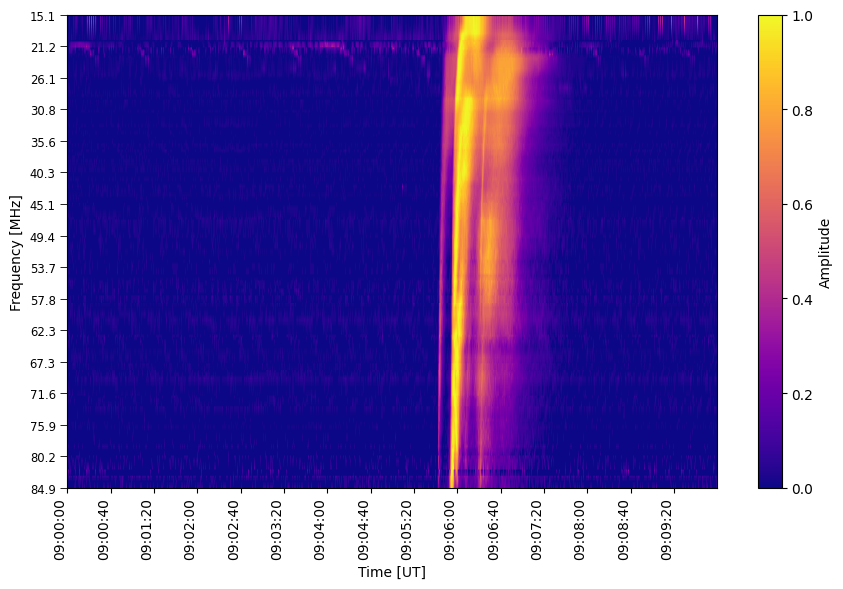

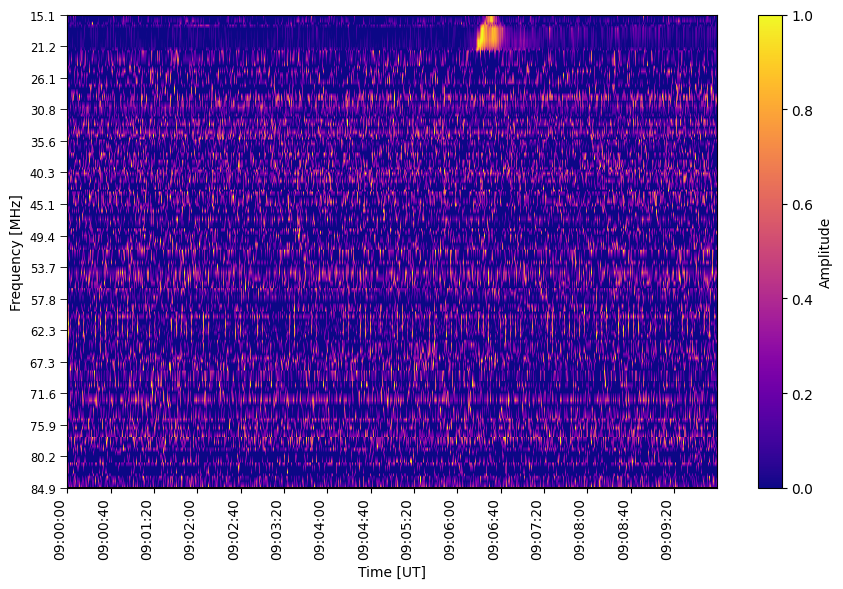

In [ ]:
# Non zero idx
samples_used = np.where(weights.detach().cpu().numpy() != 0)[0]
for idx in samples_used:
    print(datas_sample[idx].attrs['INSTRUME'])
    fig = plot_spectogram_mpl(datas_sample[idx], datas_sample[idx].attrs['INSTRUME'], start_datetime, end_datetime)
    fig

/tmp/ipykernel_105254/3911396914.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(datas_sample[idx], 'ad', start_datetime, end_datetime).show()


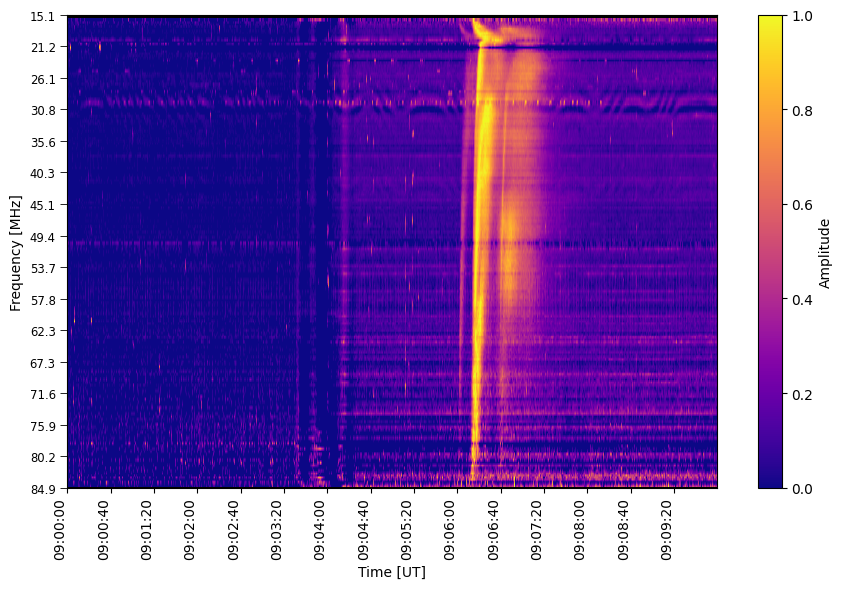

In [ ]:
# Zero idx
samples_not_used = np.where(weights.detach().cpu().numpy() == 0)[0]
for idx in samples_not_used:
    plot_spectogram_mpl(datas_sample[idx], 'ad', start_datetime, end_datetime).show()

In [ ]:
samples_not_used

array([2, 5])

/tmp/ipykernel_12782/2898652197.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(datas_sample[idx], datas_sample[idx].attrs['INSTRUME'], start_datetime, end_datetime).show()
/tmp/ipykernel_12782/2898652197.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(datas_sample[idx], datas_sample[idx].attrs['INSTRUME'], start_datetime, end_datetime).show()
/tmp/ipykernel_12782/2898652197.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plot_spectogram_mpl(datas_sample[idx], datas_sample[idx].attrs['INSTRUME'], start_datetime, end_datetime).show()
/tmp/ipykernel_12782/2898652197.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_in

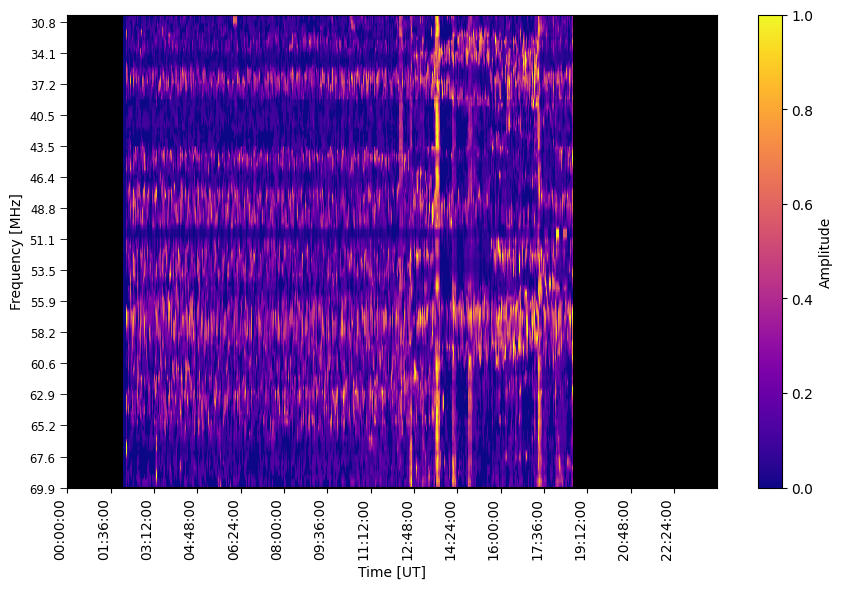

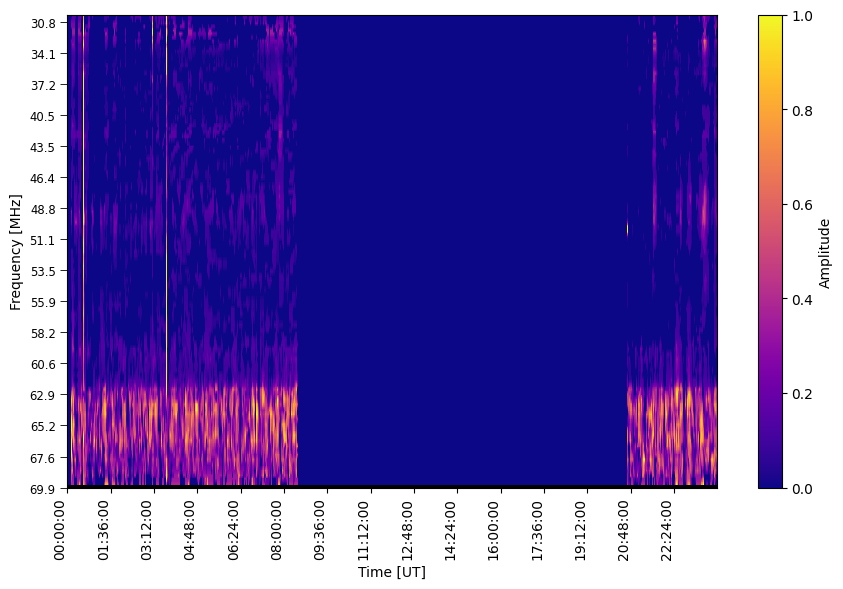

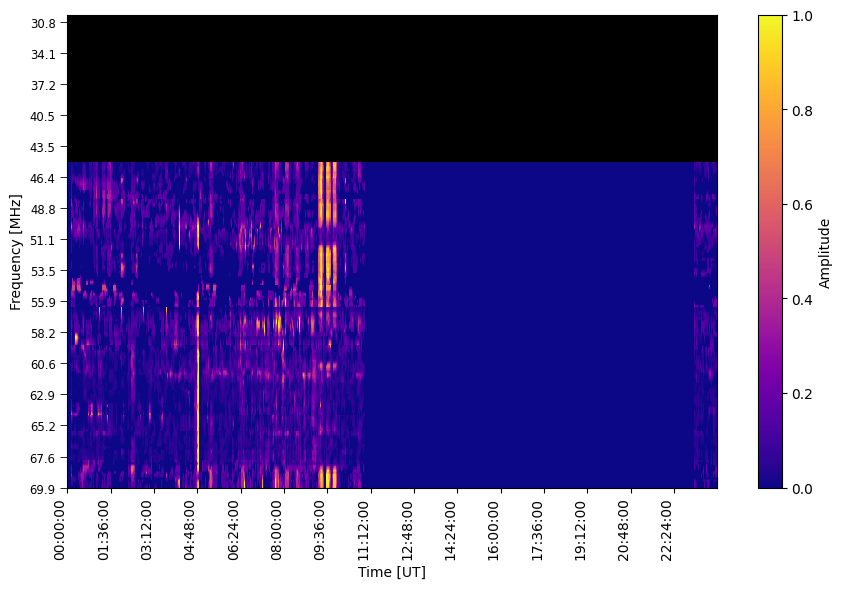

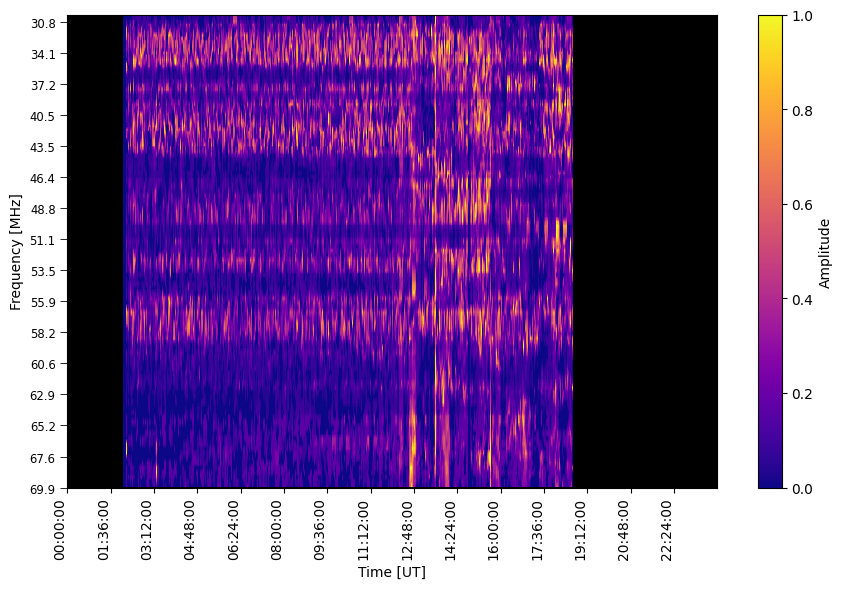

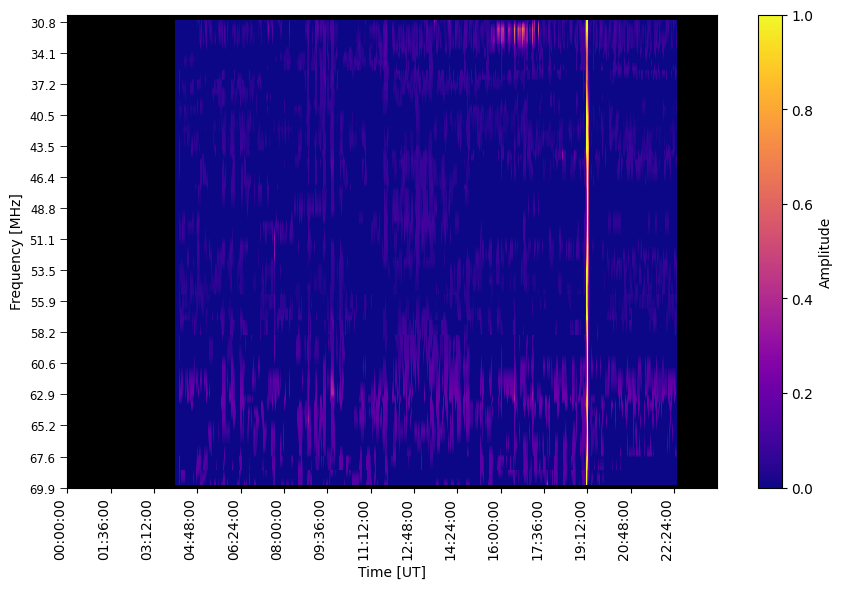

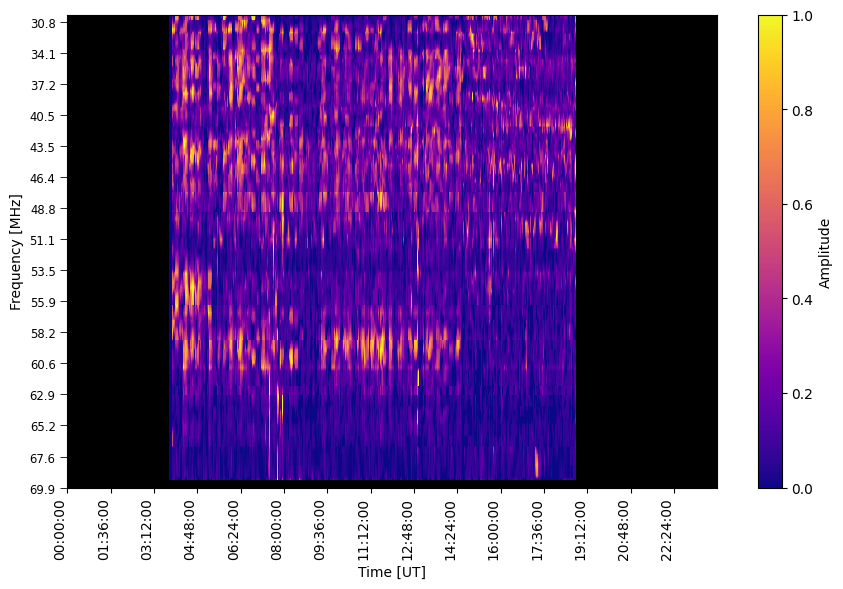

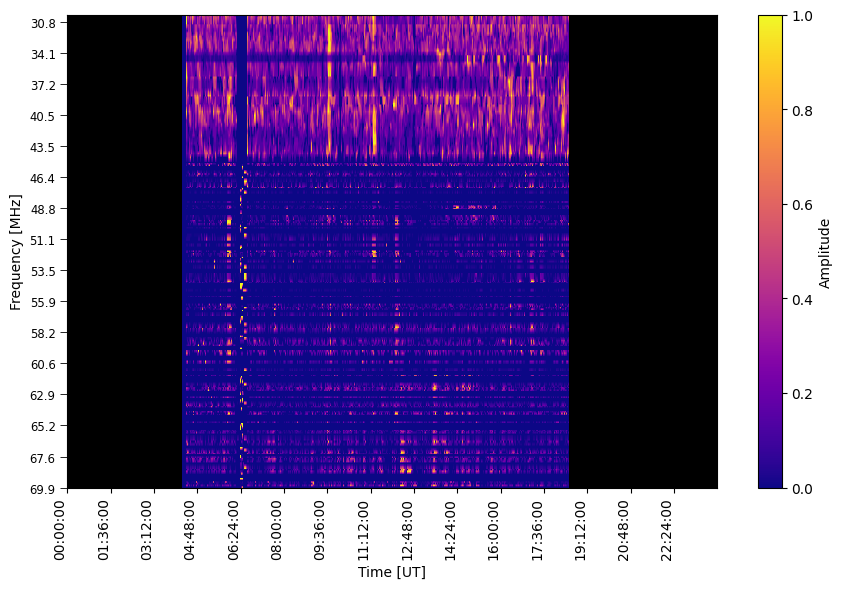

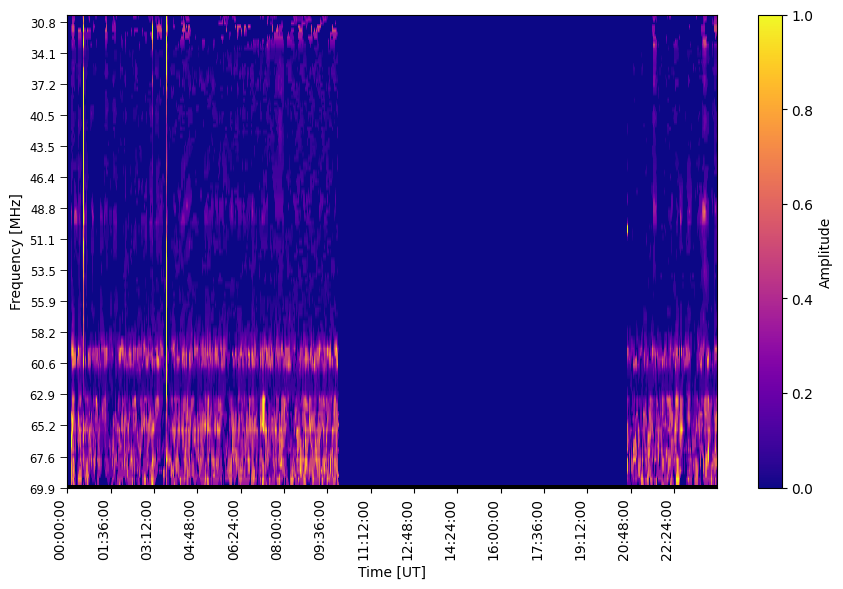

In [ ]:
# Non zero idx
samples_used = np.where(weights.detach().cpu().numpy() != 0)[0]
for idx in samples_used:
    plot_spectogram_mpl(datas_sample[idx], datas_sample[idx].attrs['INSTRUME'], start_datetime, end_datetime).show()